In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [ ]:
pwd

'/content'

In [ ]:
import os
from os.path import exists, join, basename, splitext

################# Need to revert back to CUDA 10.0 ##################
# Thanks to http://aconcaguasci.blogspot.com/2019/12/setting-up-cuda-100-for-mxnet-on-google.html
#Uninstall the current CUDA version
!apt-get --purge remove cuda nvidia* libnvidia-*
!dpkg -l | grep cuda- | awk '{print $2}' | xargs -n1 dpkg --purge
!apt-get remove cuda-*
!apt autoremove
!apt-get update

#Download CUDA 10.0
!wget  --no-clobber https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64/cuda-repo-ubuntu1804_10.0.130-1_amd64.deb
#install CUDA kit dpkg
!dpkg -i cuda-repo-ubuntu1804_10.0.130-1_amd64.deb
!sudo apt-key adv --fetch-keys https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64/7fa2af80.pub
!apt-get update
!apt-get install cuda-10-0
#Slove libcurand.so.10 error
!wget --no-clobber http://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64/nvidia-machine-learning-repo-ubuntu1804_1.0.0-1_amd64.deb
#-nc, --no-clobber: skip downloads that would download to existing files.
!apt install ./nvidia-machine-learning-repo-ubuntu1804_1.0.0-1_amd64.deb
!apt-get update
####################################################################

git_repo_url = 'https://github.com/TadasBaltrusaitis/OpenFace.git'
project_name = splitext(basename(git_repo_url))[0]
# clone openface
!git clone -q --depth 1 $git_repo_url

# install new CMake becaue of CUDA10
!wget -q https://cmake.org/files/v3.13/cmake-3.13.0-Linux-x86_64.tar.gz
!tar xfz cmake-3.13.0-Linux-x86_64.tar.gz --strip-components=1 -C /usr/local

# Get newest GCC
!sudo apt-get update
!sudo apt-get install build-essential 
!sudo apt-get install g++-8

# install python dependencies
!pip install -q youtube-dl

# Finally, actually install OpenFace
!cd OpenFace && bash ./download_models.sh && sudo bash ./install.sh

Streaming output truncated to the last 5000 lines.
  inflating: opencv-4.1.0/samples/dnn/object_detection.cpp  
  inflating: opencv-4.1.0/samples/dnn/object_detection.py  
  inflating: opencv-4.1.0/samples/dnn/openpose.cpp  
  inflating: opencv-4.1.0/samples/dnn/openpose.py  
  inflating: opencv-4.1.0/samples/dnn/segmentation.cpp  
  inflating: opencv-4.1.0/samples/dnn/segmentation.py  
  inflating: opencv-4.1.0/samples/dnn/shrink_tf_graph_weights.py  
  inflating: opencv-4.1.0/samples/dnn/text_detection.cpp  
  inflating: opencv-4.1.0/samples/dnn/text_detection.py  
  inflating: opencv-4.1.0/samples/dnn/tf_text_graph_common.py  
  inflating: opencv-4.1.0/samples/dnn/tf_text_graph_faster_rcnn.py  
  inflating: opencv-4.1.0/samples/dnn/tf_text_graph_mask_rcnn.py  
  inflating: opencv-4.1.0/samples/dnn/tf_text_graph_ssd.py  
   creating: opencv-4.1.0/samples/gpu/
  inflating: opencv-4.1.0/samples/gpu/CMakeLists.txt  
  inflating: opencv-4.1.0/samples/gpu/alpha_comp.cpp  
  inflating: ope

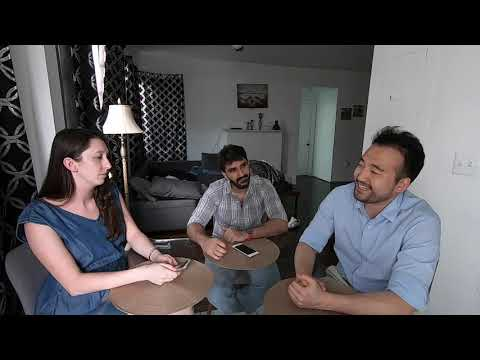

In [ ]:
from IPython.display import YouTubeVideo

# Change the Youtube_ID with the link to your group's video.
YOUTUBE_ID = 'XtA6FQz8BHQ'

YouTubeVideo(YOUTUBE_ID)

In [ ]:
!rm -rf youtube.mp4
# download the youtube with the given ID
!youtube-dl -f 'bestvideo[ext=mp4]' --output "youtube.%(ext)s" https://www.youtube.com/watch?v=$YOUTUBE_ID
# cut the first 5 seconds
!ffmpeg -y -loglevel info -i youtube.mp4 -t 10 video1.mp4
# clear any previous outputs.
!rm -rf processed
# detect poses on the these 10 seconds.
!./OpenFace/build/bin/FaceLandmarkVidMulti -f video1.mp4 -out_dir processed
# convert the result into MP4
!ffmpeg -y -loglevel info -i processed/video1.avi output.mp4

[youtube] XtA6FQz8BHQ: Downloading webpage
[youtube] XtA6FQz8BHQ: Downloading MPD manifest
[dashsegments] Total fragments: 13
[download] Destination: youtube.mp4
[download] 100% of 21.00MiB in 00:01
ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-

In [ ]:
def show_local_mp4_video(file_name, width=640, height=480):
  import io
  import base64
  from IPython.display import HTML
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))

show_local_mp4_video('output.mp4', width=960, height=720)

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import pandas as pd, seaborn as sns
sns.set_style('white')
import matplotlib.pyplot as plt 

# Load data
df = pd.read_csv('processed/video1.csv')
# Remove empty spaces in column names.
df.columns = [col.replace(" ", "") for col in df.columns]
# Print few values of data.
print(f"Max number of frames {df.frame.max()}", f"\nTotal shape of dataframe {df.shape}")
df.head()

Max number of frames 300 
Total shape of dataframe (947, 714)


,frame,face_id,timestamp,confidence,success,gaze_0_x,gaze_0_y,gaze_0_z,gaze_1_x,gaze_1_y,gaze_1_z,gaze_angle_x,gaze_angle_y,eye_lmk_x_0,eye_lmk_x_1,eye_lmk_x_2,eye_lmk_x_3,eye_lmk_x_4,eye_lmk_x_5,eye_lmk_x_6,eye_lmk_x_7,eye_lmk_x_8,eye_lmk_x_9,eye_lmk_x_10,eye_lmk_x_11,eye_lmk_x_12,eye_lmk_x_13,eye_lmk_x_14,eye_lmk_x_15,eye_lmk_x_16,eye_lmk_x_17,eye_lmk_x_18,eye_lmk_x_19,eye_lmk_x_20,eye_lmk_x_21,eye_lmk_x_22,eye_lmk_x_23,eye_lmk_x_24,eye_lmk_x_25,eye_lmk_x_26,...,p_29,p_30,p_31,p_32,p_33,AU01_r,AU02_r,AU04_r,AU05_r,AU06_r,AU07_r,AU09_r,AU10_r,AU12_r,AU14_r,AU15_r,AU17_r,AU20_r,AU23_r,AU25_r,AU26_r,AU45_r,AU01_c,AU02_c,AU04_c,AU05_c,AU06_c,AU07_c,AU09_c,AU10_c,AU12_c,AU14_c,AU15_c,AU17_c,AU20_c,AU23_c,AU25_c,AU26_c,AU28_c,AU45_c
0,1,0,0.000,0.98,1,-0.377982,0.451237,-0.808403,-0.595300,0.411779,-0.689968,-0.576,0.523,1427.8,1430.5,1435.6,1440.3,1441.8,1439.4,1434.0,1429.3,1420.4,1424.0,1428.5,1433.7,1438.7,1442.6,1445.2,1442.1,1437.9,1432.8,1428.0,1423.7,1432.2,1434.3,1436.6,1437.7,1437.1,1435.0,1432.7,...,0.605,0.300,0.111,0.122,0.043,0.37,0.0,0.0,0.00,0.31,0.00,0.0,0.47,0.00,0.00,0.00,1.06,0.91,0.00,0.00,0.00,2.56,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
1,1,1,0.000,0.88,1,0.170617,0.226819,-0.958876,0.022906,0.237220,-0.971186,0.100,0.236,932.6,933.8,937.2,940.8,942.6,941.7,938.0,934.4,928.1,930.1,933.1,936.8,940.7,943.9,946.2,943.9,940.7,937.1,933.6,930.5,936.2,937.8,939.3,939.8,939.1,937.5,936.0,...,0.002,0.018,-0.022,0.004,-0.005,0.00,0.0,0.0,0.75,0.00,0.00,0.0,0.58,0.05,2.04,0.36,1.60,1.34,0.03,0.67,2.03,1.08,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0
2,1,2,0.000,0.03,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000,365.8,368.4,373.4,378.1,379.5,377.4,371.9,367.3,361.0,364.0,368.1,373.1,378.3,382.2,384.9,381.2,376.5,371.7,367.2,363.5,370.4,372.5,374.9,376.1,375.4,373.2,370.9,...,-0.091,-0.132,-0.326,-0.143,0.166,1.85,0.0,0.0,0.00,0.64,0.00,0.0,1.61,0.53,0.73,0.54,0.06,1.36,1.37,0.00,0.92,0.31,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
3,2,0,0.033,0.98,1,-0.375557,0.464381,-0.802065,-0.590863,0.419239,-0.689289,-0.575,0.535,1429.7,1432.3,1437.5,1442.0,1443.3,1440.9,1435.6,1431.0,1421.9,1425.6,1430.2,1435.5,1440.4,1444.1,1446.5,1443.5,1439.3,1434.4,1429.5,1425.2,1433.9,1435.9,1438.2,1439.3,1438.8,1436.7,1434.5,...,0.523,0.326,0.156,0.171,0.032,0.72,0.0,0.0,0.00,0.40,0.00,0.0,0.44,0.00,0.00,0.00,0.90,1.02,0.04,0.00,0.00,2.48,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
4,2,1,0.033,0.88,1,0.182224,0.286096,-0.940714,0.028456,0.300343,-0.953407,0.111,0.300,932.7,933.7,937.0,940.6,942.4,941.6,938.1,934.5,928.1,930.2,933.1,936.8,940.5,943.6,945.9,943.7,940.6,937.1,933.6,930.5,936.2,937.8,939.2,939.7,938.9,937.3,935.9,...,0.023,0.084,-0.034,-0.056,-0.012,0.00,0.0,0.0,0.55,0.00,0.56,0.0,0.56,0.00,2.21,0.76,1.39,2.18,0.00,0.95,1.74,1.25,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0


In [ ]:
# See how many unique faces there are
print("Number of unique faces: ", len(df.face_id.unique()), "\nList of face_id's: ", df.face_id.unique())

Number of unique faces:  4 
List of face_id's:  [0 1 2 3]


#**New Dataset**

In [ ]:
NameList = []
import os
filepath = "/content/gdrive/My Drive/Test Videos"
for audio in os.listdir(filepath):
  NameList.append(audio.split('.mp4')[0])

NameList, len(NameList)

(['Aavriti Arora',
  'Amit Kumar Singh',
  'ABHISHEK SINGH2',
  'Aayush Upadhyay',
  'Aliza Nadir',
  'Abhishek Singh3',
  'Abhishek Singh1',
  'ANJALI BHATT',
  'ARUSH SHARMA',
  'Anish Jindal',
  'Arshdeep kaur',
  'Anubhav Jain',
  'Amrita Singh',
  'Debajit Kumar Bhatta',
  'Divya Sunil Nair',
  'Harshitha M',
  'Dhairya Nagdev',
  'Hariharan K S',
  'Ayush Rawat',
  'Athulya Krishnan',
  'Gagandeep Singh',
  'Bharvi Shah',
  'Lakshay kapoor',
  'Jaykumar Maniyar',
  'Jayasuriya Nandhagopal',
  'Nayana Rose C W',
  'Prabhat Mishra',
  'Pawan Negi',
  'Nikhil Shukla',
  'Neha Chauhan',
  'Lavendra Singh',
  'Riya Sanjay Gangwal',
  'Reshabh S P',
  'Ravisha Khurana',
  'Ravi Kumar Singh',
  'Pratyusha',
  'Vishal Bhati',
  'Shivani sejra',
  'Vansh Yadav',
  'SHANTANU MANISH',
  'Suyash Goenka',
  'Ronit Bainipal',
  'Samarth Rajesh Shirodkar',
  'SANJAY GM',
  'Shambhavi Singh',
  'Shanmukha sri manikanta ravuri',
  'Shivangi Bakshi',
  'Shivangi Chaturvedi',
  'Shivani Sharma',
  

In [ ]:
# clear any previous outputs.
!rm -rf processed

# detect poses on the these 10 seconds.
!./OpenFace/build/bin/FeatureExtraction -f "/content/gdrive/My Drive/visakha mundra.mp4" -out_dir processed

# convert the result into MP4
!ffmpeg -y -loglevel info -i "/content/processed/visakha mundra.avi" "/content/processed/visakha mundra.mp4"

Could not find the HAAR face detector location
Reading the landmark detector/tracker from: ./OpenFace/build/bin/model/main_ceclm_general.txt
Reading the landmark detector module from: ./OpenFace/build/bin/model/cen_general.txt
Reading the PDM module from: ./OpenFace/build/bin/model/pdms/In-the-wild_aligned_PDM_68.txt....Done
Reading the Triangulations module from: ./OpenFace/build/bin/model/tris_68.txt....Done
Reading the intensity CEN patch experts from: ./OpenFace/build/bin/model/patch_experts/cen_patches_0.25_of.dat....Done
Reading the intensity CEN patch experts from: ./OpenFace/build/bin/model/patch_experts/cen_patches_0.35_of.dat....Done
Reading the intensity CEN patch experts from: ./OpenFace/build/bin/model/patch_experts/cen_patches_0.50_of.dat....Done
Reading the intensity CEN patch experts from: ./OpenFace/build/bin/model/patch_experts/cen_patches_1.00_of.dat....Done
Reading part based module....left_eye_28
Reading the landmark detector/tracker from: ./OpenFace/build/bin/mode

In [ ]:
def show_local_mp4_video(file_name, width=640, height=480):
  import io
  import base64
  from IPython.display import HTML
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))

show_local_mp4_video("/content/processed/Mangal.mp4", width=960, height=720)

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import pandas as pd, seaborn as sns
sns.set_style('white')
import matplotlib.pyplot as plt 

# Load data
df = pd.read_csv("/content/processed/visakha mundra.csv")
# Remove empty spaces in column names.
df.columns = [col.replace(" ", "") for col in df.columns]
# Print few values of data.
print(f"Max number of frames {df.frame.max()}", f"\nTotal shape of dataframe {df.shape}")
df

Max number of frames 2503 
Total shape of dataframe (2503, 714)


,frame,face_id,timestamp,confidence,success,gaze_0_x,gaze_0_y,gaze_0_z,gaze_1_x,gaze_1_y,gaze_1_z,gaze_angle_x,gaze_angle_y,eye_lmk_x_0,eye_lmk_x_1,eye_lmk_x_2,eye_lmk_x_3,eye_lmk_x_4,eye_lmk_x_5,eye_lmk_x_6,eye_lmk_x_7,eye_lmk_x_8,eye_lmk_x_9,eye_lmk_x_10,eye_lmk_x_11,eye_lmk_x_12,eye_lmk_x_13,eye_lmk_x_14,eye_lmk_x_15,eye_lmk_x_16,eye_lmk_x_17,eye_lmk_x_18,eye_lmk_x_19,eye_lmk_x_20,eye_lmk_x_21,eye_lmk_x_22,eye_lmk_x_23,eye_lmk_x_24,eye_lmk_x_25,eye_lmk_x_26,...,p_29,p_30,p_31,p_32,p_33,AU01_r,AU02_r,AU04_r,AU05_r,AU06_r,AU07_r,AU09_r,AU10_r,AU12_r,AU14_r,AU15_r,AU17_r,AU20_r,AU23_r,AU25_r,AU26_r,AU45_r,AU01_c,AU02_c,AU04_c,AU05_c,AU06_c,AU07_c,AU09_c,AU10_c,AU12_c,AU14_c,AU15_c,AU17_c,AU20_c,AU23_c,AU25_c,AU26_c,AU28_c,AU45_c
0,1,0,0.00,0.00,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,0,0.04,0.00,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,0,0.08,0.00,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,0,0.12,0.00,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,0,0.16,0.00,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.000,0.000,0.000,0.000,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2498,2499,0,99.92,0.98,1,0.151952,-0.096206,-0.983695,-0.107962,-0.152911,-0.982325,0.022,-0.126,247.3,248.5,253.3,258.8,261.7,260.8,255.7,250.2,239.6,243.2,248.1,254.0,259.6,263.5,266.2,263.7,259.7,254.6,249.2,244.1,252.3,254.8,257.1,257.7,256.3,253.7,251.5,...,-0.210,-0.009,0.304,0.061,-0.156,0.44,0.20,1.66,0.0,0.0,0.0,0.01,0.45,0.0,0.0,0.31,0.76,0.19,0.34,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2499,2500,0,99.96,0.98,1,0.151438,-0.094223,-0.983966,-0.108955,-0.149351,-0.982763,0.022,-0.123,247.3,248.5,253.3,258.7,261.7,260.8,255.7,250.2,239.6,243.2,248.1,254.0,259.5,263.5,266.2,263.7,259.6,254.6,249.2,244.1,252.3,254.8,257.1,257.6,256.2,253.7,251.5,...,-0.214,-0.014,0.306,0.059,-0.153,0.40,0.25,1.66,0.0,0.0,0.0,0.01,0.41,0.0,0.0,0.38,0.69,0.27,0.27,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2500,2501,0,100.00,0.98,1,0.136695,-0.089855,-0.986530,-0.123857,-0.156138,-0.979939,0.007,-0.124,247.3,248.7,253.6,258.9,261.7,260.6,255.4,250.1,240.8,243.8,248.3,253.

In [ ]:
# See how many unique faces there are
print("Number of unique faces: ", len(df.face_id.unique()), "\nList of face_id's: ", df.face_id.unique())

Number of unique faces:  1 
List of face_id's:  [0]


In [ ]:
df.to_csv("/content/gdrive/My Drive/visakha mundra.csv")

**No Need**

In [ ]:
from google.colab import files
files.download("/content/processed/Harshitha M.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**Taking the mean of all Frames and concatenating  the result of all candidates into one dataframe**

In [ ]:
import glob

NameList = []
import os
filepath = "/content/drive/My Drive/EvueMe New Dataset/OpenFace Features/Top 120 Rejected OpenFace CSV files"
for audio in os.listdir(filepath):
  NameList.append(audio.split('.mp4')[0])

NameList, len(NameList)

##################################################################################################################

DF_list = []
for OpenFace_CSV in glob.glob("/content/drive/My Drive/EvueMe New Dataset/OpenFace Features/Top 120 Rejected OpenFace CSV files/*.csv"):
  df = pd.read_csv(OpenFace_CSV)
  DF = df.mean(axis=0)
  DF_list.append(DF)

DF_rejected = pd.DataFrame(DF_list)
DF_rejected

#################################################################################################################
DF_list = []
for OpenFace_CSV in glob.glob("/content/drive/My Drive/EvueMe New Dataset/OpenFace Features/Top 130 Selected OpenFace CSV files/*.csv"):
  df = pd.read_csv(OpenFace_CSV)
  DF = df.mean(axis=0)
  DF_list.append(DF)

DF_shortlisted = pd.DataFrame(DF_list)
DF_shortlisted

##################################################################################################################
OpenFace_Features_df = pd.concat([DF_shortlisted, DF_rejected], axis=0)

OpenFace_Features_df.to_csv("/content/drive/My Drive/EvueMe New Dataset/Features/OpenFaceFeatures_Top130shortlisted_Top120rejected.csv.csv")

##################################################################################################################
DF_list = []
for OpenFace_CSV in glob.glob("/content/drive/My Drive/EvueMe New Dataset/OpenFace Features/50 Can_be_Considered OpenFace CSV files/*.csv"):
  df = pd.read_csv(OpenFace_CSV)
  DF = df.mean(axis=0)
  DF_list.append(DF)

DF_50_can_be_considered = pd.DataFrame(DF_list)
DF_50_can_be_considered

DF_50_can_be_considered.to_csv("/content/drive/My Drive/EvueMe New Dataset/Features/OpenFace Features(1-250).csv")

'''

In [ ]:
OpenFace_df = pd.read_csv("/content/drive/My Drive/EvueMe New Dataset/Features/OpenFace Features(1-250).csv")
OpenFace_df

,Unnamed: 0,frame,face_id,timestamp,confidence,success,gaze_0_x,gaze_0_y,gaze_0_z,gaze_1_x,gaze_1_y,gaze_1_z,gaze_angle_x,gaze_angle_y,eye_lmk_x_0,eye_lmk_x_1,eye_lmk_x_2,eye_lmk_x_3,eye_lmk_x_4,eye_lmk_x_5,eye_lmk_x_6,eye_lmk_x_7,eye_lmk_x_8,eye_lmk_x_9,eye_lmk_x_10,eye_lmk_x_11,eye_lmk_x_12,eye_lmk_x_13,eye_lmk_x_14,eye_lmk_x_15,eye_lmk_x_16,eye_lmk_x_17,eye_lmk_x_18,eye_lmk_x_19,eye_lmk_x_20,eye_lmk_x_21,eye_lmk_x_22,eye_lmk_x_23,eye_lmk_x_24,eye_lmk_x_25,...,p_29,p_30,p_31,p_32,p_33,AU01_r,AU02_r,AU04_r,AU05_r,AU06_r,AU07_r,AU09_r,AU10_r,AU12_r,AU14_r,AU15_r,AU17_r,AU20_r,AU23_r,AU25_r,AU26_r,AU45_r,AU01_c,AU02_c,AU04_c,AU05_c,AU06_c,AU07_c,AU09_c,AU10_c,AU12_c,AU14_c,AU15_c,AU17_c,AU20_c,AU23_c,AU25_c,AU26_c,AU28_c,AU45_c
0,0,1619.5,0.0,64.74,0.968545,0.992588,0.132334,0.051260,-0.984641,0.023239,0.054758,-0.992145,0.078388,0.053567,274.082983,275.811211,280.059790,284.336689,286.140117,284.715750,280.165225,275.886010,268.077980,270.739592,274.383230,278.897313,283.511427,287.133200,289.788264,286.930358,282.884219,278.440951,274.309636,270.732026,278.269086,280.146912,282.009728,282.768159,281.976158,280.099938,...,-0.112567,0.116364,0.022023,-0.080289,0.114635,0.307872,0.123027,0.215825,0.058613,0.468548,0.570649,0.094700,0.352048,0.723091,1.331214,0.193904,0.625383,0.144951,0.196374,0.754157,0.450411,0.347038,0.437925,0.362261,0.036133,0.677579,0.493823,0.768684,0.139901,0.551884,0.541075,0.557752,0.114577,0.261272,0.050031,0.018221,0.348981,0.107165,0.004015,0.348981
1,1,2917.5,0.0,116.66,0.977290,0.997600,-0.009857,0.178392,-0.976422,-0.170090,0.195686,-0.956823,-0.092551,0.190942,262.251423,263.794721,268.122180,272.697977,274.843092,273.690127,268.973174,264.396778,257.217689,259.389698,262.778180,267.313661,272.296812,276.376397,279.482311,276.334522,271.952263,267.339544,263.169249,259.698132,266.861827,268.911622,270.850206,271.542749,270.583750,268.532636,...,-0.054978,0.029760,-0.172744,-0.129405,0.029337,0.179647,0.092425,0.818509,0.094979,0.640987,0.812367,0.054421,0.634275,0.602787,0.432803,0.120190,0.382832,0.119385,0.131764,0.815038,0.510926,0.187869,0.169181,0.263798,0.019026,0.588790,0.588447,0.002743,0.004971,0.873672,0.284882,0.695920,0.041824,0.066850,0.099931,0.818478,0.283510,0.187350,0.010627,0.246315
2,2,1243.5,0.0,49.70,0.975270,0.995173,0.107731,0.128508,-0.980188,-0.072105,0.132950,-0.980887,0.018113,0.132573,258.355712,260.204747,265.177152,270.364602,272.728319,271.319067,265.905712,260.719549,252.320595,254.746460,258.567860,263.725302,269.414401,273.997184,277.458488,273.775865,268.762430,263.556154,258.861223,255.005792,263.577192,265.898029,268.123974,268.951850,267.895897,265.576066,...,0.380494,-0.061251,-0.120056,0.026218,-0.109959,0.127506,0.077100,0.530209,0.098270,0.034147,0.006826,0.068077,0.340752,0.635072,0.356227,0.142051,0.591866,0.105865,0.142192,0.554131,0.477498,0.288130,0.047064,0.114240,0.004425,0.988737,0.000000,0.000000,0.016492,0.957763,0.905068,0.577635,0.037409,0.349960,0.046661,0.223250,0.325825,0.135559,0.000000,0.196299
3,3,2893.0,0.0,115.68,0.979946,1.000000,0.045423,0.138802,-0.984828,-0.109629,0.136603,-0.980510,-0.032662,0.139216,268.669421,270.733570,276.561452,282.739931,285.647381,284.079499,277.756422,271.579067,261.698704,265.183094,270.008003,276.074296,282.494071,287.812221,291.863924,287.984235,282.265238,276.095022,270.377390,265.420432,274.788764,277.568142,280.188038,281.117113,279.807710,277.028401,...,-0.124984,-0.171719,0.215908,0.001524,0.000877,0.191144,0.082923,1.106152,0.070484,0.010074,0.275264,0.071658,0.476866,0.004410,0.144465,0.133990,0.464303,0.108736,0.207476,0.462698,0.438797,0.211094,0.101124,0.063786,0.374417,0.088159,0.001210,0.431806,0.018496,0.342783,0.070354,0.422472,0.070182,0.196716,0.061020,0.171305,0.262576,0.108729,0.003284,0.207779
4,4,805.5,0.0,32.18,0.971391,0.991304,-0.055336,0.103181,-0.989612,-0.075459,0.108526,-0.987343,-0.065446,0.107083,301.648447,303.632547,308.682484,313.835280,316.076149,314.542422,309.041366,3

In [ ]:
OpenFace_df.drop(OpenFace_df.columns[[0,2]], axis = 1, inplace = True)
OpenFace_df

,frame,timestamp,confidence,success,gaze_0_x,gaze_0_y,gaze_0_z,gaze_1_x,gaze_1_y,gaze_1_z,gaze_angle_x,gaze_angle_y,eye_lmk_x_0,eye_lmk_x_1,eye_lmk_x_2,eye_lmk_x_3,eye_lmk_x_4,eye_lmk_x_5,eye_lmk_x_6,eye_lmk_x_7,eye_lmk_x_8,eye_lmk_x_9,eye_lmk_x_10,eye_lmk_x_11,eye_lmk_x_12,eye_lmk_x_13,eye_lmk_x_14,eye_lmk_x_15,eye_lmk_x_16,eye_lmk_x_17,eye_lmk_x_18,eye_lmk_x_19,eye_lmk_x_20,eye_lmk_x_21,eye_lmk_x_22,eye_lmk_x_23,eye_lmk_x_24,eye_lmk_x_25,eye_lmk_x_26,eye_lmk_x_27,...,p_29,p_30,p_31,p_32,p_33,AU01_r,AU02_r,AU04_r,AU05_r,AU06_r,AU07_r,AU09_r,AU10_r,AU12_r,AU14_r,AU15_r,AU17_r,AU20_r,AU23_r,AU25_r,AU26_r,AU45_r,AU01_c,AU02_c,AU04_c,AU05_c,AU06_c,AU07_c,AU09_c,AU10_c,AU12_c,AU14_c,AU15_c,AU17_c,AU20_c,AU23_c,AU25_c,AU26_c,AU28_c,AU45_c
0,1619.5,64.74,0.968545,0.992588,0.132334,0.051260,-0.984641,0.023239,0.054758,-0.992145,0.078388,0.053567,274.082983,275.811211,280.059790,284.336689,286.140117,284.715750,280.165225,275.886010,268.077980,270.739592,274.383230,278.897313,283.511427,287.133200,289.788264,286.930358,282.884219,278.440951,274.309636,270.732026,278.269086,280.146912,282.009728,282.768159,281.976158,280.099938,278.237369,277.478845,...,-0.112567,0.116364,0.022023,-0.080289,0.114635,0.307872,0.123027,0.215825,0.058613,0.468548,0.570649,0.094700,0.352048,0.723091,1.331214,0.193904,0.625383,0.144951,0.196374,0.754157,0.450411,0.347038,0.437925,0.362261,0.036133,0.677579,0.493823,0.768684,0.139901,0.551884,0.541075,0.557752,0.114577,0.261272,0.050031,0.018221,0.348981,0.107165,0.004015,0.348981
1,2917.5,116.66,0.977290,0.997600,-0.009857,0.178392,-0.976422,-0.170090,0.195686,-0.956823,-0.092551,0.190942,262.251423,263.794721,268.122180,272.697977,274.843092,273.690127,268.973174,264.396778,257.217689,259.389698,262.778180,267.313661,272.296812,276.376397,279.482311,276.334522,271.952263,267.339544,263.169249,259.698132,266.861827,268.911622,270.850206,271.542749,270.583750,268.532636,266.594978,265.902211,...,-0.054978,0.029760,-0.172744,-0.129405,0.029337,0.179647,0.092425,0.818509,0.094979,0.640987,0.812367,0.054421,0.634275,0.602787,0.432803,0.120190,0.382832,0.119385,0.131764,0.815038,0.510926,0.187869,0.169181,0.263798,0.019026,0.588790,0.588447,0.002743,0.004971,0.873672,0.284882,0.695920,0.041824,0.066850,0.099931,0.818478,0.283510,0.187350,0.010627,0.246315
2,1243.5,49.70,0.975270,0.995173,0.107731,0.128508,-0.980188,-0.072105,0.132950,-0.980887,0.018113,0.132573,258.355712,260.204747,265.177152,270.364602,272.728319,271.319067,265.905712,260.719549,252.320595,254.746460,258.567860,263.725302,269.414401,273.997184,277.458488,273.775865,268.762430,263.556154,258.861223,255.005792,263.577192,265.898029,268.123974,268.951850,267.895897,265.576066,263.350402,262.522969,...,0.380494,-0.061251,-0.120056,0.026218,-0.109959,0.127506,0.077100,0.530209,0.098270,0.034147,0.006826,0.068077,0.340752,0.635072,0.356227,0.142051,0.591866,0.105865,0.142192,0.554131,0.477498,0.288130,0.047064,0.114240,0.004425,0.988737,0.000000,0.000000,0.016492,0.957763,0.905068,0.577635,0.037409,0.349960,0.046661,0.223250,0.325825,0.135559,0.000000,0.196299
3,2893.0,115.68,0.979946,1.000000,0.045423,0.138802,-0.984828,-0.109629,0.136603,-0.980510,-0.032662,0.139216,268.669421,270.733570,276.561452,282.739931,285.647381,284.079499,277.756422,271.579067,261.698704,265.183094,270.008003,276.074296,282.494071,287.812221,291.863924,287.984235,282.265238,276.095022,270.377390,265.420432,274.788764,277.568142,280.188038,281.117113,279.807710,277.028401,274.408470,273.480467,...,-0.124984,-0.171719,0.215908,0.001524,0.000877,0.191144,0.082923,1.106152,0.070484,0.010074,0.275264,0.071658,0.476866,0.004410,0.144465,0.133990,0.464303,0.108736,0.207476,0.462698,0.438797,0.211094,0.101124,0.063786,0.374417,0.088159,0.001210,0.431806,0.018496,0.342783,0.070354,0.422472,0.070182,0.196716,0.061020,0.171305,0.262576,0.108729,0.003284,0.207779
4,805.5,32.18,0.971391,0.991304,-0.055336,0.103181,-0.989612,-0.075459,0.108526,-0.987343,-0.065446,0.107083,301.648447,30

In [ ]:
OpenFace_Features_df = pd.concat([Name_df, OpenFace_df], axis=1)
OpenFace_Features_df

,Name,frame,timestamp,confidence,success,gaze_0_x,gaze_0_y,gaze_0_z,gaze_1_x,gaze_1_y,gaze_1_z,gaze_angle_x,gaze_angle_y,eye_lmk_x_0,eye_lmk_x_1,eye_lmk_x_2,eye_lmk_x_3,eye_lmk_x_4,eye_lmk_x_5,eye_lmk_x_6,eye_lmk_x_7,eye_lmk_x_8,eye_lmk_x_9,eye_lmk_x_10,eye_lmk_x_11,eye_lmk_x_12,eye_lmk_x_13,eye_lmk_x_14,eye_lmk_x_15,eye_lmk_x_16,eye_lmk_x_17,eye_lmk_x_18,eye_lmk_x_19,eye_lmk_x_20,eye_lmk_x_21,eye_lmk_x_22,eye_lmk_x_23,eye_lmk_x_24,eye_lmk_x_25,eye_lmk_x_26,...,p_29,p_30,p_31,p_32,p_33,AU01_r,AU02_r,AU04_r,AU05_r,AU06_r,AU07_r,AU09_r,AU10_r,AU12_r,AU14_r,AU15_r,AU17_r,AU20_r,AU23_r,AU25_r,AU26_r,AU45_r,AU01_c,AU02_c,AU04_c,AU05_c,AU06_c,AU07_c,AU09_c,AU10_c,AU12_c,AU14_c,AU15_c,AU17_c,AU20_c,AU23_c,AU25_c,AU26_c,AU28_c,AU45_c
0,Dishant Mehta,1619.5,64.74,0.968545,0.992588,0.132334,0.051260,-0.984641,0.023239,0.054758,-0.992145,0.078388,0.053567,274.082983,275.811211,280.059790,284.336689,286.140117,284.715750,280.165225,275.886010,268.077980,270.739592,274.383230,278.897313,283.511427,287.133200,289.788264,286.930358,282.884219,278.440951,274.309636,270.732026,278.269086,280.146912,282.009728,282.768159,281.976158,280.099938,278.237369,...,-0.112567,0.116364,0.022023,-0.080289,0.114635,0.307872,0.123027,0.215825,0.058613,0.468548,0.570649,0.094700,0.352048,0.723091,1.331214,0.193904,0.625383,0.144951,0.196374,0.754157,0.450411,0.347038,0.437925,0.362261,0.036133,0.677579,0.493823,0.768684,0.139901,0.551884,0.541075,0.557752,0.114577,0.261272,0.050031,0.018221,0.348981,0.107165,0.004015,0.348981
1,Sudeep Mangal,2917.5,116.66,0.977290,0.997600,-0.009857,0.178392,-0.976422,-0.170090,0.195686,-0.956823,-0.092551,0.190942,262.251423,263.794721,268.122180,272.697977,274.843092,273.690127,268.973174,264.396778,257.217689,259.389698,262.778180,267.313661,272.296812,276.376397,279.482311,276.334522,271.952263,267.339544,263.169249,259.698132,266.861827,268.911622,270.850206,271.542749,270.583750,268.532636,266.594978,...,-0.054978,0.029760,-0.172744,-0.129405,0.029337,0.179647,0.092425,0.818509,0.094979,0.640987,0.812367,0.054421,0.634275,0.602787,0.432803,0.120190,0.382832,0.119385,0.131764,0.815038,0.510926,0.187869,0.169181,0.263798,0.019026,0.588790,0.588447,0.002743,0.004971,0.873672,0.284882,0.695920,0.041824,0.066850,0.099931,0.818478,0.283510,0.187350,0.010627,0.246315
2,KHUSHI ARORA,1243.5,49.70,0.975270,0.995173,0.107731,0.128508,-0.980188,-0.072105,0.132950,-0.980887,0.018113,0.132573,258.355712,260.204747,265.177152,270.364602,272.728319,271.319067,265.905712,260.719549,252.320595,254.746460,258.567860,263.725302,269.414401,273.997184,277.458488,273.775865,268.762430,263.556154,258.861223,255.005792,263.577192,265.898029,268.123974,268.951850,267.895897,265.576066,263.350402,...,0.380494,-0.061251,-0.120056,0.026218,-0.109959,0.127506,0.077100,0.530209,0.098270,0.034147,0.006826,0.068077,0.340752,0.635072,0.356227,0.142051,0.591866,0.105865,0.142192,0.554131,0.477498,0.288130,0.047064,0.114240,0.004425,0.988737,0.000000,0.000000,0.016492,0.957763,0.905068,0.577635,0.037409,0.349960,0.046661,0.223250,0.325825,0.135559,0.000000,0.196299
3,Shivam Garg,2893.0,115.68,0.979946,1.000000,0.045423,0.138802,-0.984828,-0.109629,0.136603,-0.980510,-0.032662,0.139216,268.669421,270.733570,276.561452,282.739931,285.647381,284.079499,277.756422,271.579067,261.698704,265.183094,270.008003,276.074296,282.494071,287.812221,291.863924,287.984235,282.265238,276.095022,270.377390,265.420432,274.788764,277.568142,280.188038,281.117113,279.807710,277.028401,274.408470,...,-0.124984,-0.171719,0.215908,0.001524,0.000877,0.191144,0.082923,1.106152,0.070484,0.010074,0.275264,0.071658,0.476866,0.004410,0.144465,0.133990,0.464303,0.108736,0.207476,0.462698,0.438797,0.211094,0.101124,0.063786,0.374417,0.088159,0.001210,0.431806,0.018496,0.342783,0.070354,0.422472,0.070182,0.196716,0.061020,0.171305,0.262576,0.108729,0.003284,0.207779
4,Sonam kanyal,805.5,32.18,0.971391,0.991304,-0.055336,0.103181,-0.989612,-0.075459,0.108526,-0.987343,-0.065446,0.107083

In [ ]:
OpenFace_Features_df.sort_values("Name", axis = 0, ascending = True, inplace = True) 
OpenFace_Features_df

,Name,frame,timestamp,confidence,success,gaze_0_x,gaze_0_y,gaze_0_z,gaze_1_x,gaze_1_y,gaze_1_z,gaze_angle_x,gaze_angle_y,eye_lmk_x_0,eye_lmk_x_1,eye_lmk_x_2,eye_lmk_x_3,eye_lmk_x_4,eye_lmk_x_5,eye_lmk_x_6,eye_lmk_x_7,eye_lmk_x_8,eye_lmk_x_9,eye_lmk_x_10,eye_lmk_x_11,eye_lmk_x_12,eye_lmk_x_13,eye_lmk_x_14,eye_lmk_x_15,eye_lmk_x_16,eye_lmk_x_17,eye_lmk_x_18,eye_lmk_x_19,eye_lmk_x_20,eye_lmk_x_21,eye_lmk_x_22,eye_lmk_x_23,eye_lmk_x_24,eye_lmk_x_25,eye_lmk_x_26,...,p_29,p_30,p_31,p_32,p_33,AU01_r,AU02_r,AU04_r,AU05_r,AU06_r,AU07_r,AU09_r,AU10_r,AU12_r,AU14_r,AU15_r,AU17_r,AU20_r,AU23_r,AU25_r,AU26_r,AU45_r,AU01_c,AU02_c,AU04_c,AU05_c,AU06_c,AU07_c,AU09_c,AU10_c,AU12_c,AU14_c,AU15_c,AU17_c,AU20_c,AU23_c,AU25_c,AU26_c,AU28_c,AU45_c
158,ARUNPRAGASH M,488.5,19.50,0.964416,0.987705,0.079949,0.101118,-0.986344,-0.153734,0.088742,-0.976621,-0.036480,0.096944,210.051537,213.035656,220.014242,226.900717,229.660656,227.259221,219.698770,212.813832,202.709119,206.317725,211.401127,218.104406,225.466189,231.575410,236.261783,231.126844,224.418443,217.393648,211.277971,206.347848,216.782787,220.090061,223.443545,224.878893,223.557992,220.247541,216.897643,...,-0.233573,-0.546629,0.121376,-0.431083,0.005265,0.240328,0.137551,0.432859,0.075932,0.337172,1.304529,0.049160,0.079805,0.042131,0.010912,0.119846,0.415072,0.142982,0.183012,0.855707,0.835195,0.389662,0.282787,0.318648,0.741803,0.025615,0.000000,0.087090,0.000000,0.102459,0.000000,0.015369,0.063525,0.203893,0.079918,0.080943,0.377049,0.335041,0.002049,0.200820
174,ATASHI PANDA,656.0,26.20,0.971030,0.990847,0.026990,0.120381,-0.988545,-0.121552,0.144554,-0.977671,-0.047387,0.134307,287.504729,289.030130,293.485278,298.253928,300.545309,299.399771,294.564683,289.795805,281.810450,284.251106,287.951411,292.840046,298.009992,302.074447,305.129138,302.066895,297.643783,292.861327,288.457513,284.659497,292.187948,294.366590,296.399085,297.094508,296.046606,293.872387,291.841037,...,0.075232,0.000730,0.032018,0.019352,0.060921,0.110572,0.048543,0.082746,0.057437,0.036232,0.037551,0.037315,0.160793,0.310854,0.313966,0.101152,0.390809,0.077681,0.214996,0.636384,0.301571,0.420221,0.154844,0.038139,0.000000,0.735317,0.000000,0.001526,0.000000,0.102212,0.273074,0.231121,0.030511,0.316552,0.000000,0.322654,0.297483,0.127384,0.000763,0.273074
249,Aaditya Dinesh Thokade,1322.5,52.86,0.973495,0.999244,0.111676,0.178901,-0.971359,-0.004056,0.157157,-0.981722,0.055127,0.170225,222.216906,224.539523,229.879803,235.108699,237.163389,235.246823,229.500303,224.271142,216.109834,219.229614,223.699130,229.353442,235.177648,239.684153,242.881051,239.166150,234.030257,228.526815,223.456959,219.144970,227.436649,229.746558,232.104274,233.129160,232.223865,229.914334,227.557110,...,0.056665,0.059333,0.421866,0.186384,-0.203703,0.191433,0.091774,0.552723,0.146509,0.136388,0.220715,0.064138,0.010885,0.039436,0.254955,0.138396,0.368472,0.105560,0.158041,0.660200,0.377738,0.192803,0.128593,0.108926,0.000756,0.253026,0.002269,0.004917,0.006430,0.014372,0.000000,0.046142,0.054463,0.088880,0.016263,0.449697,0.313540,0.239410,0.001513,0.241679
175,Aakansha Das,769.0,30.72,0.969811,0.990241,0.157131,0.113820,-0.971900,-0.036239,0.124045,-0.981143,0.062066,0.121260,188.304489,190.794990,197.371308,204.183474,207.239753,205.356929,198.174301,191.361809,181.153155,183.962589,188.818998,195.725634,203.466688,209.560768,214.075537,209.091152,202.391802,195.470917,189.378465,184.490696,195.099349,198.306571,201.410410,202.588939,201.153221,197.945218,194.845934,...,0.112917,0.115755,-0.086243,-0.128966,0.043942,0.118334,0.062056,0.166897,0.104502,0.047241,0.041243,0.083520,0.029362,0.089532,0.004099,0.156994,0.398204,0.154574,0.194899,0.653474,0.559649,0.288595,0.042290,0.116461,0.000000,0.985686,0.000000,0.014314,0.029278,0.010410,0.046845,0.000000,0.121015,0.171763,0.093689,0.225114,0.289525,0.150943,0.000000,0.235524
21,Aakash Bomb,984.5,39.34,0.963379,0.987805,0.020953,0.052747,-0.992596,-0.052762,0.005208,-0.992601,-0.014946,

#**Old Dataset (31)**

**Vartika**

In [ ]:
# clear any previous outputs.
!rm -rf processed
# detect poses on the these 10 seconds.
!./OpenFace/build/bin/FeatureExtraction -f /content/gdrive/My Drive/Test Videos/ABHISHEK SINGH2.mp4 -out_dir 
# convert the result into MP4
!ffmpeg -y -loglevel info -i processed/ABHISHEK SINGH2.avi ABHISHEK SINGH2.mp4

Could not find the HAAR face detector location
Reading the landmark detector/tracker from: ./OpenFace/build/bin/model/main_ceclm_general.txt
Reading the landmark detector module from: ./OpenFace/build/bin/model/cen_general.txt
Reading the PDM module from: ./OpenFace/build/bin/model/pdms/In-the-wild_aligned_PDM_68.txt....Done
Reading the Triangulations module from: ./OpenFace/build/bin/model/tris_68.txt....Done
Reading the intensity CEN patch experts from: ./OpenFace/build/bin/model/patch_experts/cen_patches_0.25_of.dat....Done
Reading the intensity CEN patch experts from: ./OpenFace/build/bin/model/patch_experts/cen_patches_0.35_of.dat....Done
Reading the intensity CEN patch experts from: ./OpenFace/build/bin/model/patch_experts/cen_patches_0.50_of.dat....Done
Reading the intensity CEN patch experts from: ./OpenFace/build/bin/model/patch_experts/cen_patches_1.00_of.dat....Done
Reading part based module....left_eye_28
Reading the landmark detector/tracker from: ./OpenFace/build/bin/mode

In [ ]:
def show_local_mp4_video(file_name, width=640, height=480):
  import io
  import base64
  from IPython.display import HTML
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))

show_local_mp4_video('newoutput.mp4', width=960, height=720)

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import pandas as pd, seaborn as sns
sns.set_style('white')
import matplotlib.pyplot as plt 

# Load data
df = pd.read_csv('processed/Vartika_Q.No-12.csv')
# Remove empty spaces in column names.
df.columns = [col.replace(" ", "") for col in df.columns]
# Print few values of data.
print(f"Max number of frames {df.frame.max()}", f"\nTotal shape of dataframe {df.shape}")
df.head()

Max number of frames 1092 
Total shape of dataframe (1092, 714)


,frame,face_id,timestamp,confidence,success,gaze_0_x,gaze_0_y,gaze_0_z,gaze_1_x,gaze_1_y,gaze_1_z,gaze_angle_x,gaze_angle_y,eye_lmk_x_0,eye_lmk_x_1,eye_lmk_x_2,eye_lmk_x_3,eye_lmk_x_4,eye_lmk_x_5,eye_lmk_x_6,eye_lmk_x_7,eye_lmk_x_8,eye_lmk_x_9,eye_lmk_x_10,eye_lmk_x_11,eye_lmk_x_12,eye_lmk_x_13,eye_lmk_x_14,eye_lmk_x_15,eye_lmk_x_16,eye_lmk_x_17,eye_lmk_x_18,eye_lmk_x_19,eye_lmk_x_20,eye_lmk_x_21,eye_lmk_x_22,eye_lmk_x_23,eye_lmk_x_24,eye_lmk_x_25,eye_lmk_x_26,...,p_29,p_30,p_31,p_32,p_33,AU01_r,AU02_r,AU04_r,AU05_r,AU06_r,AU07_r,AU09_r,AU10_r,AU12_r,AU14_r,AU15_r,AU17_r,AU20_r,AU23_r,AU25_r,AU26_r,AU45_r,AU01_c,AU02_c,AU04_c,AU05_c,AU06_c,AU07_c,AU09_c,AU10_c,AU12_c,AU14_c,AU15_c,AU17_c,AU20_c,AU23_c,AU25_c,AU26_c,AU28_c,AU45_c
0,1,0,0.00,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,0,0.04,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,0,0.08,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,0,0.12,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,0,0.16,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# See how many unique faces there are
print("Number of unique faces: ", len(df.face_id.unique()), "\nList of face_id's: ", df.face_id.unique())

Number of unique faces:  1 
List of face_id's:  [0]


In [ ]:
from google.colab import files
files.download('processed/Vartika_Q.No-12.csv')